# Visualize Historical Stock Data with a Candlestick Chart 

Candlestick charts are popular way to visualize price movements and trading patterns in the financial industry. In this notebook, I will create candlestick chart for a stock or group of stocks and then find the correlation between these stocks or group of stocks. 

## Step 1. Download and load packages

In this template, I will be making use of the [yfinance](https://pypi.org/project/yfinance/) package, which allows you to download market data from the Yahoo! Finance API.

In [26]:
# Load packages
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import yfinance as yf
from datetime import datetime, timedelta
from pytz import timezone
import seaborn as sns
import matplotlib.pyplot as plt


## Step 2. Select a stock and date range

Which stock do you want to visualize? Set `symbol` to the stock ticker symbol of your choice in the next code cell.

⚠️ If you get this error: `No data found for this date range, symbol may be delisted`, you're not entering a valid stock symbol. You can look up companies and their symbols [here](https://finance.yahoo.com/lookup/).

In [28]:
# Prompt the user for ticker symbols input
symbol_input = input("Input ticker symbols separated by commas (e.g., 'SPOT, AAPL, GOOGL'): ")

# Remove any quotation marks from the input
symbol_input = symbol_input.replace("'", "").replace('"', '')

# Extract ticker symbols from user input
symbols = [symbol.strip() for symbol in symbol_input.split(",")]

for symbol in symbols:
    # Get historical market prices and range of dates
    prices = yf.Ticker(symbol)
    prices = prices.history(period="max")

    if prices.empty:
        print(f"No data available for {symbol}.")
        continue

    max_date = prices.index.max().date()
    min_date = prices.index.min().date()

    # Preview the data
    print(f"Prices available for {symbol} from {min_date} to {max_date}.")
    print(prices.head())
    print()

Input ticker symbols separated by commas (e.g., 'SPOT, AAPL, GOOGL'): 'SPOT, AAPL, GOOGL, SPY, WISH, TSLA, NFLX, VIAD'
Prices available for SPOT from 2018-04-03 to 2023-07-17.
                                 Open        High         Low       Close  \
Date                                                                        
2018-04-03 00:00:00-04:00  165.899994  169.000000  148.259995  149.009995   
2018-04-04 00:00:00-04:00  140.000000  148.929993  135.509995  144.220001   
2018-04-05 00:00:00-04:00  149.229996  152.410004  141.250000  143.990005   
2018-04-06 00:00:00-04:00  146.070007  148.729996  144.669998  147.919998   
2018-04-09 00:00:00-04:00  149.500000  151.000000  148.589996  150.000000   

                             Volume  Dividends  Stock Splits  
Date                                                          
2018-04-03 00:00:00-04:00  30526500        0.0           0.0  
2018-04-04 00:00:00-04:00  11702900        0.0           0.0  
2018-04-05 00:00:00-04:00   7372

Once you've chosen a valid stock symbol or set of stocks, you can specify a date range as short or long as you would like. Just make sure it's within the available date range provided in the last cell's output. If you don't set your own range, all dates will be plotted by default.

In [29]:
# Prompt the user for the date range
start_date_input = input("Enter the start date (YYYY-MM-DD): ")
end_date_input = input("Enter the end date (YYYY-MM-DD): ")

# Convert start and end dates to datetime objects with timezone
tz = timezone('US/Eastern')
start_date = pd.to_datetime(start_date_input).tz_localize(tz)
end_date = pd.to_datetime(end_date_input).tz_localize(tz)

# Loop through each symbol and slice data by date
for symbol in symbols:
    # Get historical market prices and range of dates
    prices = yf.Ticker(symbol)
    prices = prices.history(period="max")

    if prices.empty:
        print(f"No data available for {symbol}.")
        continue

    # Slice prices based on the provided date range
    prices = prices[start_date:end_date]

    # Preview the data
    print(f"Prices available for {symbol} from {start_date} to {end_date}.")
    print(prices.head())
    print()


Enter the start date (YYYY-MM-DD): 2010-10-10
Enter the end date (YYYY-MM-DD): 2023-01-20
Prices available for SPOT from 2010-10-10 00:00:00-04:00 to 2023-01-20 00:00:00-05:00.
                                 Open        High         Low       Close  \
Date                                                                        
2018-04-03 00:00:00-04:00  165.899994  169.000000  148.259995  149.009995   
2018-04-04 00:00:00-04:00  140.000000  148.929993  135.509995  144.220001   
2018-04-05 00:00:00-04:00  149.229996  152.410004  141.250000  143.990005   
2018-04-06 00:00:00-04:00  146.070007  148.729996  144.669998  147.919998   
2018-04-09 00:00:00-04:00  149.500000  151.000000  148.589996  150.000000   

                             Volume  Dividends  Stock Splits  
Date                                                          
2018-04-03 00:00:00-04:00  30526500        0.0           0.0  
2018-04-04 00:00:00-04:00  11702900        0.0           0.0  
2018-04-05 00:00:00-04:00   737

## Step 3. Plot the data

This code cell creates a the candlestick chart using Plotly. Code comments are provided if you are interested in customizing the chart.

In [30]:
import plotly.graph_objects as go

# Loop through each symbol and create a separate chart
for symbol in symbols:
    # Get historical market prices and range of dates
    prices = yf.Ticker(symbol)
    prices = prices.history(period="max")

    if prices.empty:
        print(f"No data available for {symbol}.")
        continue

    # Create a candlestick chart
    fig = go.Figure(
        data=[
            go.Candlestick(
                x=prices.index,
                open=prices["Open"],
                high=prices["High"],
                low=prices["Low"],
                close=prices["Close"],
                increasing_line_color="tomato",
                decreasing_line_color="forestgreen",
            )
        ]
    )

    # Customize the layout
    fig.update_layout(
        title=f"Stock Prices Candlestick Chart - {symbol}",
        width=900,
        height=500,
        xaxis_rangeslider_visible=True,
        template="ggplot2",
    )

    # Show the chart
    fig.show()


The plot is interactive - you can zoom into specific periods using the range slider at the bottom of the plot. Depending on how zoomed in you are, you can hover over the candlesticks to read information about that day's price. You can always reset to the plot's original state by double-clicking anywhere in the plot. 

## Step 4. Plot the data on the same graph

This code cell creates a the candlestick chart using Plotly for all tickers on the same graph and based on the date range that had been specified.

In [33]:
import plotly.graph_objects as go

# Create a new figure
fig = go.Figure()

# Define a list of colors
colors = ['tomato', 'forestgreen', 'royalblue']

# Loop through each symbol and add a trace to the figure with a different color
for i, symbol in enumerate(symbols):
    # Get historical market prices and range of dates
    prices = yf.Ticker(symbol)
    prices = prices.history(period="max")

    if prices.empty:
        print(f"No data available for {symbol}.")
        continue

    # Slice prices based on the provided date range
    prices = prices[start_date:end_date]

    # Add a trace for the current symbol with a different color
    fig.add_trace(
        go.Candlestick(
            x=prices.index,
            open=prices["Open"],
            high=prices["High"],
            low=prices["Low"],
            close=prices["Close"],
            increasing_line_color=colors[i % len(colors)],
            decreasing_line_color=colors[i % len(colors)],
            name=symbol  # Set the name for the trace
        )
    )

# Customize the layout
fig.update_layout(
    title="Stock Prices Candlestick Chart",
    width=900,
    height=500,
    xaxis_rangeslider_visible=True,
    template="ggplot2",
)

# Show the chart
fig.show()


# Step 5. Generate a Correlation Matrix Between the Stocks Inputted

Calculating the correlation between stocks is essential as it provides valuable insights into the relationship and dependency among different securities. Here are a few reasons highlighting the importance of deriving correlations between stocks:

1. Diversification: Correlation analysis helps investors understand the diversification potential of their portfolios. By incorporating stocks with low or negative correlations, they can potentially reduce overall portfolio risk and enhance returns. Identifying stocks with low correlations allows for constructing a well-balanced portfolio that is less susceptible to the adverse impact of individual stock movements.

2. Risk Assessment: Correlations provide information about how stocks move in relation to one another. A high positive correlation suggests that stocks tend to move in the same direction, indicating higher systematic risk. On the other hand, low or negative correlations suggest that stocks have the potential to move independently, potentially reducing overall portfolio risk. Understanding the correlation structure aids in assessing the risk associated with specific investments and managing portfolio risk effectively.

3. Sector and Market Analysis: Correlations help investors analyze the relationships between different sectors or the broader market. By examining correlations, they can gain insights into the interdependencies and linkages among sectors, identify potential sector rotations, and gauge the overall health and sentiment of the market. This information can assist in making informed investment decisions and adjusting portfolio allocations accordingly.

4. Hedging Strategies: Correlations can be leveraged to develop hedging strategies. For example, if two stocks have a high positive correlation, an investor can use one stock to hedge against potential losses in the other. Understanding the correlation allows for strategic positioning to mitigate downside risk and protect portfolio value during market downturns.

5. Portfolio Optimization: Correlations play a crucial role in portfolio optimization techniques. By incorporating correlations, investors can construct portfolios that aim to maximize returns while minimizing risk. Efficient portfolio allocation based on correlations can lead to improved risk-adjusted returns and better portfolio performance.
### In summary, deriving the correlation between stocks provides valuable information for portfolio construction, risk assessment, sector analysis, hedging strategies, and portfolio optimization. It allows investors to make informed decisions, manage risk effectively, and enhance the overall performance of their investments.

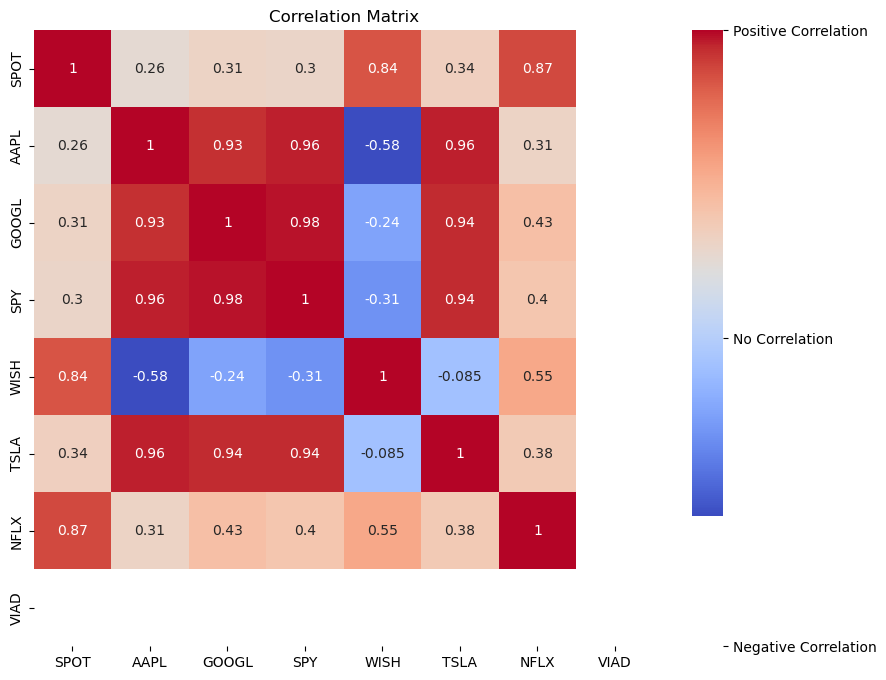

In [32]:
# Create an empty DataFrame to store the closing prices of each stock
df = pd.DataFrame()

# Loop through each symbol and retrieve the closing prices
for symbol in symbols:
    # Get historical market prices and range of dates
    prices = yf.Ticker(symbol)
    prices = prices.history(period="max")

    if prices.empty:
        print(f"No data available for {symbol}.")
        continue

    # Slice prices based on the provided date range
    prices = prices[start_date:end_date]

    # Add the closing prices to the DataFrame with the stock symbol as the column name
    df[symbol] = prices['Close']

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")

# Adjust the colorbar to indicate stronger correlations
colorbar = plt.gca().collections[0].colorbar
colorbar.set_ticks([-1, 0, 1])
colorbar.set_ticklabels(["Negative Correlation", "No Correlation", "Positive Correlation"])

# Show the plot
plt.show()
